# Beautiful Brains 
## Basic Guide

beautiful-brains is an visualization tool for presentations

Features:

 * Image registration (rigid and linear warp)
 * Mask images based on intensity or through skullstripping
 * Smooth images
 * Multi-slice panels
 * Easily automate png/jpeg creation

Future Features:

 * Template figures for QC checks and seeing your data
 * Intensity normalization

*Powered by [ANTsPy](https://antspy.readthedocs.io)*

In [2]:
import beautiful_brains as bb
import inspect

### Define the path to your images

In [3]:
MRI_PATH = '../MPRAGE.nii.gz'
PET_PATH = '../FBB.nii'

TEMPLATE_PATH = '../MNI152_T1_1mm.nii.gz'

### Here, we load the two nifti images into the BBImage 

In [4]:
print(inspect.signature(bb.load))

(path: 'str | Path', *, LUT: 'str | Path | None' = None, colormap: 'Any | None' = None, threshold: 'tuple[float, float] | None' = None, indices: 'Sequence[int] | str | None' = None, scale: 'float | None' = None, interp: 'Any | None' = None, sharpen: 'int | None' = None, bias_correction: 'bool' = False, debug: 'bool' = False) -> 'BBImage'


In [64]:
MRI = bb.load(
  MRI_PATH,
  colormap="gray",
  interp='NEAREST',
  bias_correction=True,
  scale=1,
  sharpen=0,
  threshold=(100,1900)
)

PET = bb.load(
  PET_PATH,
  colormap="soft-nih",
  interp='NEAREST',
  scale=1,
  sharpen=0,
  threshold=(100,10000)
)

## Transformations

First, I will register the PET to the MRI using rigid body transformation

In [65]:
PET = bb.transform(source=PET, target=MRI, warp='Rigid')

Next, I'll warp the MRI to my template using 12 degrees of freedom

In [66]:
MRI = bb.transform(source=MRI, target=TEMPLATE_PATH, warp='Affine')

In [67]:
PET = bb.apply_transform(source=PET, matrix=MRI.transform_info)

I can then apply that transformation matrix to other images in the same space

In [68]:
PET = bb.apply_transform(source=PET,matrix=MRI.transform_info)

## Metadata
This stores useful information about the image

In [69]:
MRI.metadata()

BBImage metadata
name: MPRAGE.nii.gz
path: ../MPRAGE.nii.gz
kind: intensity
volume:
  data: matrix shape=(208, 256, 256), dtype=float32
  affine: matrix shape=(4, 4), dtype=float64
  voxel_sizes: (1.0, 1.0, 1.0)
display:
  scale: 1.0
  interp: NEAREST
  sharpen: 0
  colormap: gray
  LUT: None
  threshold: (100.0, 1900.0)
indices: None
crop_info: None
mask: none
transform:
  status: pending
  warp: Affine
  template: ../MNI152_T1_1mm.nii.gz
  forward_transforms: 1 file(s)
  inverse_transforms: 1 file(s)
  template_volume: data matrix shape=(182, 218, 182), dtype=float32, affine matrix shape=(4, 4), dtype=float64
  template_shape: (182, 218, 182)
  template_affine: matrix shape=(4, 4), dtype=float64


In [70]:
print(PET.volume.path)
print(type(PET.volume.image))
print(type(PET.volume.data), PET.volume.data.shape)
print(type(PET.volume.affine), PET.volume.affine.shape)

../FBB.nii
<class 'nibabel.nifti1.Nifti1Image'>
<class 'numpy.ndarray'> (256, 256, 89)
<class 'numpy.ndarray'> (4, 4)


## Reslicing

I want both images to have the same dimensions so that they can share a mask. This is not necessary. Reslice is its own function so that you can transform the image multiple times without needing to interpolate the data multiple times. You can also choose to not reslice at all. the slice function will select the correct voxels based on the affine matrix, even if the logical slice is oblique to the 3 axes.

Here, I am going to choose LANCZOS interpolation which is visually pleasing.

I could also select NEAREST and BICUBIC

In [71]:
PET = PET.reslice(interp='LANCZOS')
MRI = MRI.reslice(interp='LANCZOS')

I can take a slice of my images to see what they look like

I changed the scale here because I wanted small pictures of the data. It is recommended to upscale 2x or 3x when making figures which improves visualization.

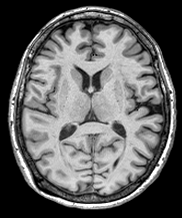

In [72]:
MRI.scale=1
MRI.slice(80)

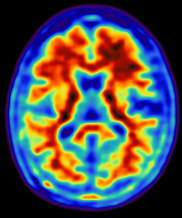

In [73]:
PET.scale=1
PET.colormap = bb.colormaps.as_listed_colormap('nih')
PET.slice(80)

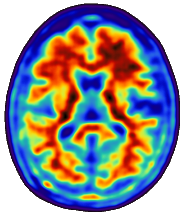

In [74]:
PET.colormap = bb.colormaps.as_listed_colormap('soft-nih')
PET.slice(80)

## Masking

I have two options to create masks

bb.create_mask 
bb.create_brainmask

The former masks the entire image and the later masks the brain 

Both are powered by antspy

In [75]:
mask = bb.create_mask(
  source=MRI,
  pad=4,
  cleanup=0,
)

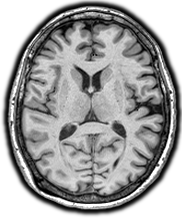

In [76]:
MRI.mask = mask
MRI.slice(80)

Here is why I chose to reslice the PET image. Now I can use the same mask for the PET as I made for the MRI.

In [77]:
PET.mask = mask

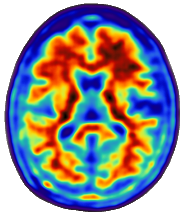

In [78]:
PET.slice(80)

## Smoothing

In [110]:
PET_smoo = bb.smooth_image(source=PET,kernel=(10,10,10))

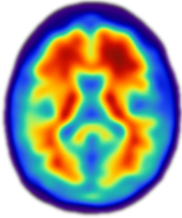

In [112]:
PET_smoo.scale=1
PET_smoo.slice(80)

## Cropping / bounding box

In [81]:
# Auto-crop or define the bounding box yourself
MRI = bb.crop(
  MRI,
  how="otsu",
  pad=0
)

In [82]:
print(MRI.volume.data.shape)
print(MRI.crop_info)

(182, 218, 182)
((0, 182), (7, 218), (0, 173))


In [83]:
MRI.crop_info = ((20, 160), (20, 200), (0, 182))

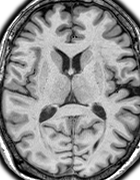

In [84]:
MRI.slice(80)

In [85]:
# Resetting the crop
MRI.crop_info = ((0, 182), (0, 218), (0, 182))

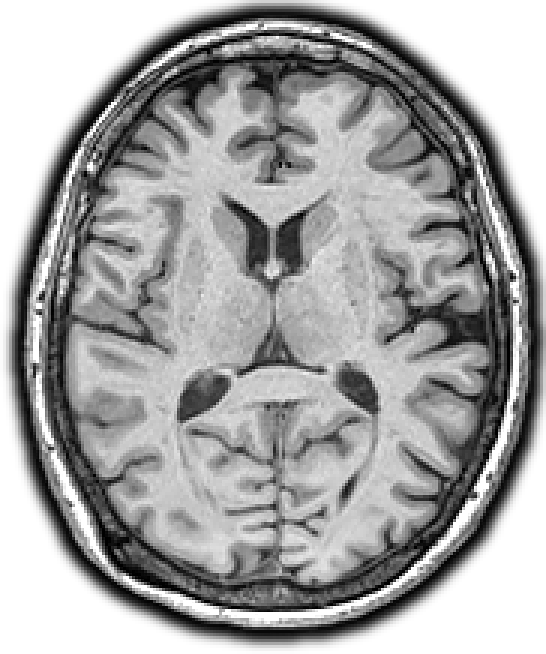

In [115]:
MRI.slice(80)

## Modifying visualization info

All the visualization metadata can be defined as such.

These values define how the slice function renders the image.

In [87]:
MRI.colormap = (bb.colormaps.as_listed_colormap('grey'))
MRI.threshold = (0,1900)

In [88]:
PET.colormap = (bb.colormaps.as_listed_colormap('nih'))
PET.threshold = (100,10000)

In [89]:
MRI.interp='NEAREST'
MRI.scale=3

In [90]:
MRI.sharpen=50

In [91]:
PET.interp = 'NEAREST'
PET.scale=3

## Creating figure panels

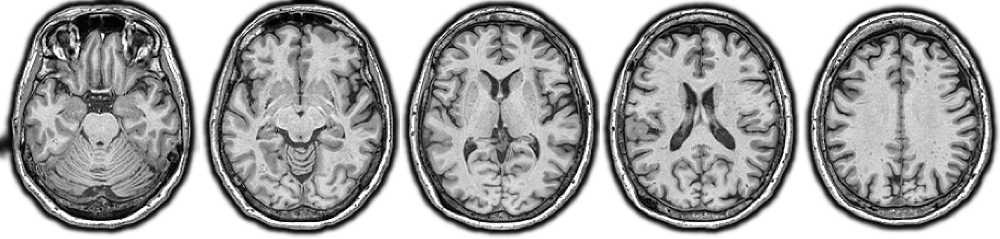

In [92]:
import numpy as np
Ratio = MRI.slice(120,'axial').size
fig = bb.bbfigure(
  size=1,
  grid=(5, 1),
  dpi=2400,
    box_ratio=(Ratio[0]/Ratio[1]),
  background=(0, 0, 0, 0),
)
for i,slice_i in enumerate(np.round(np.linspace(50,100,5),0)):
    fig[i, 0] = MRI.slice(int(slice_i), "axial",alpha=1)
img = fig.render()
img.save('figures/5x1_MRI_axial.png')
img

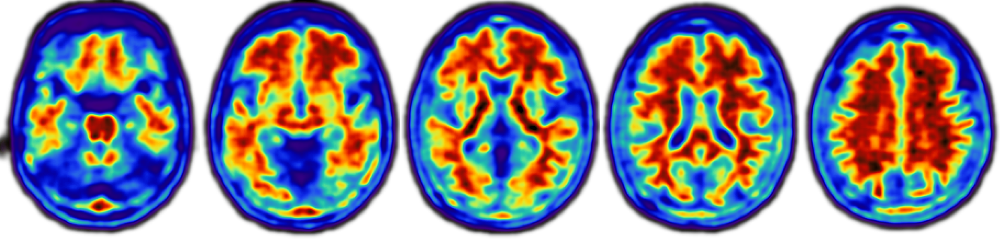

In [93]:
Ratio = MRI.slice(120,'axial').size
fig = bb.bbfigure(
  size=1,
  grid=(5, 1),
  dpi=2400,
    box_ratio=(Ratio[0]/Ratio[1]),
  background=(0, 0, 0, 0),
)
for i,slice_i in enumerate(np.round(np.linspace(50,100,5),0)):
    fig[i, 0] = PET.slice(int(slice_i), "axial",alpha=1)
img = fig.render()
img.save('./figures/5x1_PET_axial.png')
img

## Overlaying PET on MRI

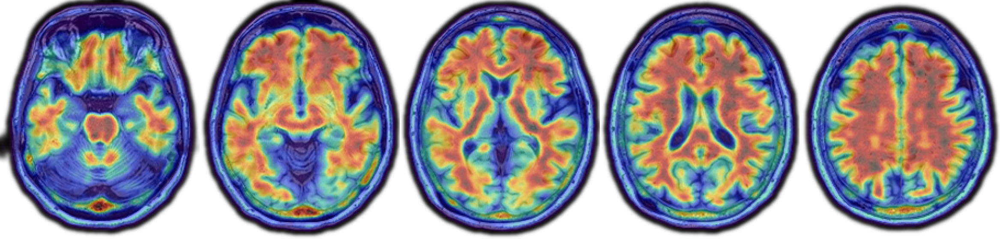

In [94]:
Ratio = MRI.slice(120,'axial').size
fig = bb.bbfigure(
  size=1,
  grid=(5, 1),
  dpi=2400,
    box_ratio=(Ratio[0]/Ratio[1]),
  background=(0, 0, 0, 0),
)
for i,slice_i in enumerate(np.round(np.linspace(50,100,5),0)):
    fig[i, 0] = MRI.slice(int(slice_i), "axial")
    fig[i, 0].append(PET.slice(int(slice_i), "axial",alpha=.55))
img = fig.render()
img.save('./figures/5x1_MRI_PET_axial.png')
img

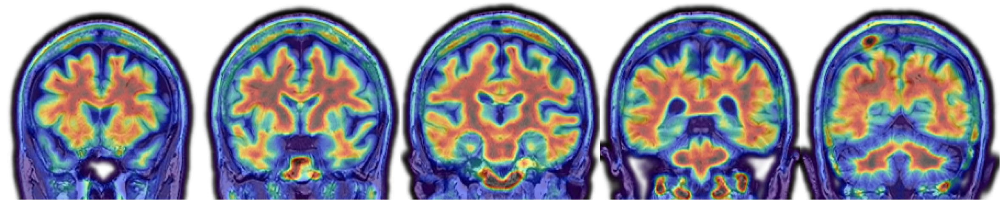

In [95]:
Ratio = MRI.slice(120,'coronal').size
fig = bb.bbfigure(
  size=1,
  grid=(5, 1),
  dpi=2400,
    box_ratio=(Ratio[0]/Ratio[1]),
  background=(0, 0, 0, 0),
)
for i,slice_i in enumerate(np.round(np.linspace(70,140,5)[::-1],0)):
    fig[i, 0] = MRI.slice(int(slice_i), "coronal")
    fig[i, 0].append(PET.slice(int(slice_i), "coronal",alpha=.55))
img = fig.render()
img.save('./figures/5x1_MRI_PET_coronal.png')
img

In [96]:
Ratio = MRI.slice(120,'axial').size
fig = bb.bbfigure(
  size=1,
  grid=(5, 2),
  dpi=2400,
    box_ratio=(Ratio[0]/Ratio[1]),
  background=(0, 0, 0, 0),
)
for i,slice_i in enumerate(np.round(np.linspace(50,100,5),0)):
    fig[i, 0] = MRI.slice(int(slice_i), "axial")
for i,slice_i in enumerate(np.round(np.linspace(50,100,5),0)[::1]):
    fig[i, 1] = (PET.slice(int(slice_i), "axial"))
img = fig.render()
img.save('./figures/5x2_MRI_PET_3.png')

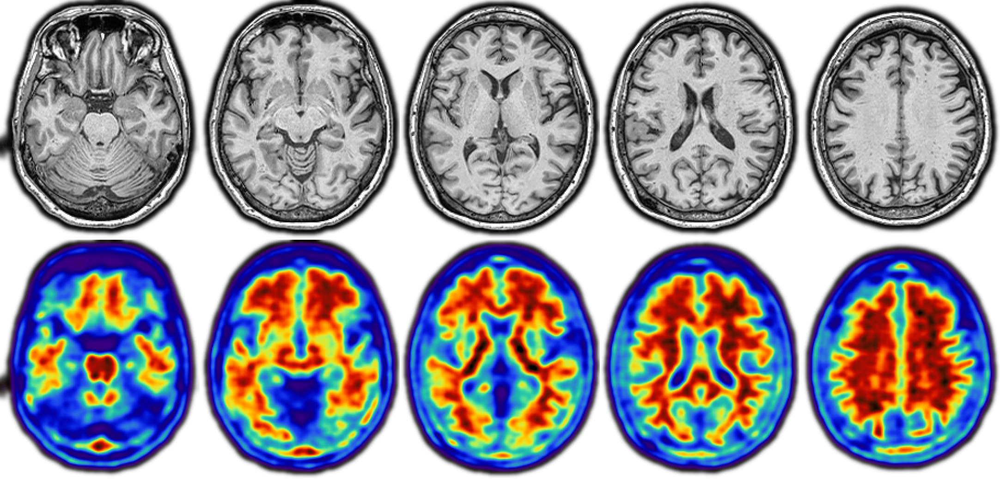

In [97]:
img

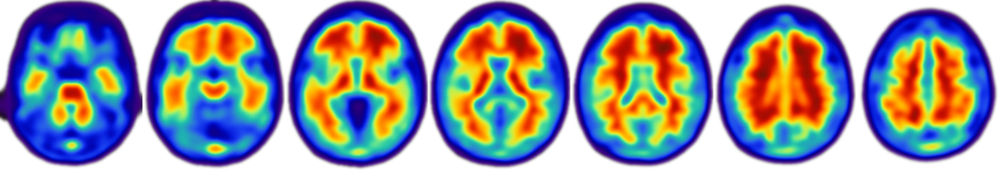

In [158]:
pet_mask = bb.create_mask(
  source=PET,
  pad=0,
  cleanup=1,
    low_thresh=100,
    max_thresh=10000
)
PET_smoo.mask = pet_mask
Ratio = PET.slice(120,'axial').size
fig = bb.bbfigure(
  size=3,
  grid=(7, 1),
  dpi=600,
    box_ratio=(Ratio[0]/Ratio[1]),
  background=(0, 0, 0, 0),
)
for i,slice_i in enumerate(np.round(np.linspace(40,110,7),0)):
    fig[i, 0] = PET_smoo.slice(int(slice_i), "axial")
img = fig.render()
img.save('./figures/logo.png')
img

### You can use any matplotlib ListedColormap or make your own

In [143]:
type(PET.colormap)

matplotlib.colors.ListedColormap

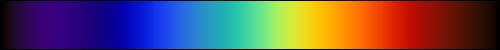

In [144]:
bb.colorbar(colormap='nih', height=50, length=500)

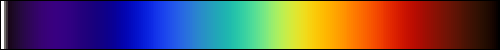

In [145]:
# 'soft' colormaps have a small transparent portion at low intensities
bb.colorbar(colormap='soft-nih', height=50, length=500)

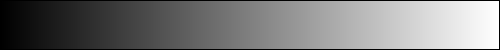

In [146]:
bb.colorbar(colormap='gray', height=50, length=500)

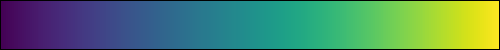

In [147]:
bb.colorbar(colormap='viridis', height=50, length=500)

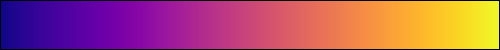

In [148]:
bb.colorbar(colormap='plasma', height=50, length=500)

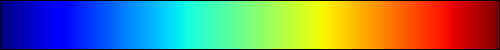

In [149]:
bb.colorbar(colormap='jet', height=50, length=500)

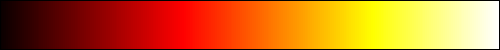

In [150]:
bb.colorbar(colormap='hot', height=50, length=500)

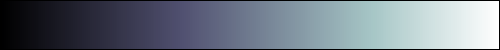

In [151]:
bb.colorbar(colormap='bone', height=50, length=500)

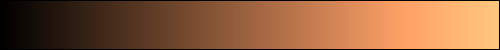

In [152]:
bb.colorbar(colormap='copper', height=50, length=500)